Data science assessment - Fraud data (36 pts total)

High-level problem statement
E-commerce websites often transact huge amounts of money. Whenever a huge amount of money is moved, there is a high risk of users performing fraudulent activities, e.g. using stolen credit cards, laundering money, etc. 

Objective
The goal of this challenge is to build a machine learning model that predicts the probability that the first transaction of a new user is fraudulent.

Details
Electronica is an e-commerce site that sells wholesale electronics. You have been contracted to build a model that predicts whether a given transaction is fraudulent or not. You only have information about each user’s first transaction on Electronica’s website. If you fail to identify a fraudulent transaction, Electronica loses money equivalent to the price of the fraudulently purchased product. If you incorrectly flag a real transaction as fraudulent, it inconveniences the Electronica customers whose valid transactions are flagged—a cost your client values at $8.



24 points for showcasing your abilities
12 points for the performance of your model
- Explore the data
- Keep all your work
- Comment your code
- Explain any features that you engineer
- Indicate which model is final
- Points will be given for originality / exploration of different model types
- Feel free to include “next steps” in the comments of your code
- You may be given partial credit for incomplete analyses
- We have withheld 20% of the dataset, with which we will evaluate the out-of-sample performance of your model.
- Ensure you build a model MVP! Once you have your MVP, then iterate to improve performance. You can’t get any credit for this section if you don’t have at least one model!
Scoring:



IP address to country mapping



# introduction to my analysis

### data engineering:
For extracting useful features,
because of the limited time, I just simply survey the country, the signup_time/purchase_time  and id/ip/device

For countries from id, I did not find any anomaly. the barchart of countries from non-fraud(0) and fraud(1) are similar

For time features, the time difference between signup and purchasing may be an indicator of fraud
Also, maybe the fraud time have some periodic rules or in specific time (e.g. their script auto-run at specific time),
so I also record minute, hour, day, week of signup_time/purchase_time

For id/ip/device, an intuition is that normal customers will only use several id/ip/device, so I count these numbers

If I have time, I will take some time to extract more useful features. e.g. id per ip, ip per device, ip from diff countries
The reason is that this data is dominated by only few features. Mining these features must can improve model predictions

### data visualization:
I mainly compare whether each feature are similar for non-fraud(0) and fraud(1)
so I find that the number of id/device and the time features can be used to identify fraud events
Other features are almost no use

Also, the correlation map also shows that 'class' (what we want to predict) is correlated with only these features  
So I decide to keep time features, id/ip/device features

    
### modeling: simple models:
I only have time to implement random forests.
The reason I choose it is that among tradictional ML algorithms, random forests can always be ~top 3 in predictions.
Another one I want to try is xgboost.
Neural Network algorithms are also often be used in fraud-detection, but I feel one day is not enough for me to explore.

If I have time, I will compare more ML algorithms in sklearn. 
I will also want to try AutoML.
    
### modeling: hyper-parameter tuning:
I only have time to tune random forest parameters, 
because the data is unbalance, I tune 'class_weight' to increase the weight of fraud events.

        
If I have time, I will tune xgboost, examine overfitting and underfitting risks, do more comparison of gridsearchCV, 
and use SMOTE resampling, which is a method to generate more pseudodata to balance a dataset.
SMOTE will generate pseudodata by their pattern, which avoid the overfitting risk compared with directly duplicating data.
Also, the loss function is not super sensitive to parameters,
so compared with taking much time on tuning, I would rather try other algorithms or feature engineering to improve the model. 

# Setup


## Install the necessary packages

In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline



## Read the Data

In [2]:
df = pd.read_csv('Candidate_tech_evaluation_candidate_copy_data science_fraud.csv', parse_dates=['signup_time', 'purchase_time'])

In [3]:
df.head()

,Unnamed: 0,user_id,signup_time,purchase_time,purchase_value,device_id,source,browser,sex,age,ip_address,class
0,149671,285108,2015-07-15 04:36:00,2015-09-10 14:17:00,31,HZAKVUFTDOSFD,Direct,Chrome,M,49,2.818400e+09,0
1,15611,131009,2015-01-24 12:29:00,2015-04-13 04:53:00,31,XGQAJSOUJIZCC,SEO,IE,F,21,3.251268e+09,0
2,73178,328855,2015-03-11 00:54:00,2015-04-05 12:23:00,16,VCCTAYDCWKZIY,Direct,IE,M,26,2.727760e+09,0
3,84546,229053,2015-01-07 13:19:00,2015-01-09 10:12:00,29,MFFIHYNXCJLEY,SEO,Chrome,M,34,2.083420e+09,0
4,35978,108439,2015-02-08 21:11:00,2015-04-09 14:26:00,26,WMSXWGVPNIFBM,Ads,FireFox,M,33,3.207913e+09,0


# data preprocessing

## data engineering: country

In [56]:
address2country = pd.read_excel('Candidate_tech_evaluation_candidate_copy_datascience_IpAddress_to_Country.xlsx', sheetname='candidate_tech_evaluation_candi')
address2country.head()

/apps/anaconda/3/current/lib/python3.6/site-packages/pandas/io/excel.py:329: FutureWarning: The `sheetname` keyword is deprecated, use `sheet_name` instead
  **kwds)


,lower_bound_ip_address,upper_bound_ip_address,country
0,16777216,16777471,Australia
1,16777472,16777727,China
2,16777728,16778239,China
3,16778240,16779263,Australia
4,16779264,16781311,China


In [5]:
countries = []
for i in range(len(df)):
    ip_address = df.loc[i, 'ip_address']
    tmp = address2country[(address2country['lower_bound_ip_address'] <= ip_address) &
                          (address2country['upper_bound_ip_address'] >= ip_address)]
    if len(tmp) == 1:
        countries.append(tmp['country'].values[0])
    else:
        countries.append('NA')
        
df['country'] = countries

df.head()

,Unnamed: 0,user_id,signup_time,purchase_time,purchase_value,device_id,source,browser,sex,age,ip_address,class,country
0,149671,285108,2015-07-15 04:36:00,2015-09-10 14:17:00,31,HZAKVUFTDOSFD,Direct,Chrome,M,49,2.818400e+09,0,United States
1,15611,131009,2015-01-24 12:29:00,2015-04-13 04:53:00,31,XGQAJSOUJIZCC,SEO,IE,F,21,3.251268e+09,0,United Kingdom
2,73178,328855,2015-03-11 00:54:00,2015-04-05 12:23:00,16,VCCTAYDCWKZIY,Direct,IE,M,26,2.727760e+09,0,United States
3,84546,229053,2015-01-07 13:19:00,2015-01-09 10:12:00,29,MFFIHYNXCJLEY,SEO,Chrome,M,34,2.083420e+09,0,Korea Republic of
4,35978,108439,2015-02-08 21:11:00,2015-04-09 14:26:00,26,WMSXWGVPNIFBM,Ads,FireFox,M,33,3.207913e+09,0,Brazil


## feature engineering: time

In [6]:
df.dtypes

Unnamed: 0                 int64
user_id                    int64
signup_time       datetime64[ns]
purchase_time     datetime64[ns]
purchase_value             int64
device_id                 object
source                    object
browser                   object
sex                       object
age                        int64
ip_address               float64
class                      int64
country                   object
dtype: object

In [7]:
(df['purchase_time'] - df['signup_time']).head()

0   57 days 09:41:00
1   78 days 16:24:00
2   25 days 11:29:00
3    1 days 20:53:00
4   59 days 17:15:00
dtype: timedelta64[ns]

In [8]:
#check functions I can apply to extract time unit
dir(df['purchase_time'][0])

['__add__',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__pyx_vtable__',
 '__radd__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__rsub__',
 '__setattr__',
 '__setstate__',
 '__sizeof__',
 '__str__',
 '__sub__',
 '__subclasshook__',
 '__weakref__',
 '_date_attributes',
 '_date_repr',
 '_get_date_name_field',
 '_get_start_end_field',
 '_has_time_component',
 '_repr_base',
 '_round',
 '_short_repr',
 '_time_repr',
 'asm8',
 'astimezone',
 'ceil',
 'combine',
 'ctime',
 'date',
 'day',
 'day_name',
 'dayofweek',
 'dayofyear',
 'days_in_month',
 'daysinmonth',
 'dst',
 'floor',
 'fold',
 'freq',
 'freqstr',
 'fromordinal',
 'fromtimestamp',
 'hour',
 'is_leap_year',
 'is_month_end',
 'is_month_start',
 'is_quarter_end',
 'is_quarter_start',
 'is_year_end',
 'is_year_start',
 'isocalenda

In [9]:
# Get the time difference between purchase time and signup time
time_diff = df['purchase_time'] - df['signup_time']
time_diff = time_diff.apply(lambda x: x.seconds)
df['time_diff'] = time_diff

In [10]:
df['purchase_time'].apply(lambda x: x.minute).head()

0    17
1    53
2    23
3    12
4    26
Name: purchase_time, dtype: int64

In [11]:
# Signup minute, hour, day, and week
df['signup_minute'] = df['signup_time'].apply(lambda x: x.minute)
df['signup_hour'] = df['signup_time'].apply(lambda x: x.hour)
df['signup_day'] = df['signup_time'].apply(lambda x: x.dayofweek)
df['signup_week'] = df['signup_time'].apply(lambda x: x.week)
#all are 2015, no need to explore df['signup_year'] = df['signup_time'].apply(lambda x: x.year)

# Purchase minute, hour, day, and week
df['purchase_minute'] = df['purchase_time'].apply(lambda x: x.minute)
df['purchase_hour'] = df['purchase_time'].apply(lambda x: x.hour)
df['purchase_day'] = df['purchase_time'].apply(lambda x: x.dayofweek)
df['purchase_week'] = df['purchase_time'].apply(lambda x: x.week)

In [12]:
df.head()

,Unnamed: 0,user_id,signup_time,purchase_time,purchase_value,device_id,source,browser,sex,age,...,country,time_diff,signup_minute,signup_hour,signup_day,signup_week,purchase_minute,purchase_hour,purchase_day,purchase_week
0,149671,285108,2015-07-15 04:36:00,2015-09-10 14:17:00,31,HZAKVUFTDOSFD,Direct,Chrome,M,49,...,United States,34860,36,4,2,29,17,14,3,37
1,15611,131009,2015-01-24 12:29:00,2015-04-13 04:53:00,31,XGQAJSOUJIZCC,SEO,IE,F,21,...,United Kingdom,59040,29,12,5,4,53,4,0,16
2,73178,328855,2015-03-11 00:54:00,2015-04-05 12:23:00,16,VCCTAYDCWKZIY,Direct,IE,M,26,...,United States,41340,54,0,2,11,23,12,6,14
3,84546,229053,2015-01-07 13:19:00,2015-01-09 10:12:00,29,MFFIHYNXCJLEY,SEO,Chrome,M,34,...,Korea Republic of,75180,19,13,2,2,12,10,4,2
4,35978,108439,2015-02-08 21:11:00,2015-04-09 14:26:00,26,WMSXWGVPNIFBM,Ads,FireFox,M,33,...,Brazil,62100,11,21,6,6,26,14,3,15


## feature engineering: sharing the same id and ip

In [13]:
# Check user number for unique devices
device_num = df[['user_id', 'device_id']].groupby('device_id').count().reset_index()
device_num = device_num.rename(columns={'user_id': 'device_num'})
#df.merge(device_num, how='left', on='device_id').head()
df = df.merge(device_num, how='left', on='device_id')
#device_num.head()

In [14]:
# Check user number for unique ip_address
ip_num = df[['user_id', 'ip_address']].groupby('ip_address').count().reset_index()
ip_num = ip_num.rename(columns={'user_id': 'ip_num'})
df = df.merge(ip_num, how='left', on='ip_address')
#ip_num.head()


## Descriptive statistics on the data

In [15]:
print('class = 0: ',df[df['class'] == 0].size)
print('class = 1: ',df[df['class'] == 1].size)
print('ratio of (class=1)/(class=0) = ',df[df['class'] == 1].size/df[df['class'] == 0].size)

class = 0:  2609640
class = 1:  270360
ratio of (class=1)/(class=0) =  0.10360049662022348


In [16]:
print("ALL")
print(df.describe())

ALL
          Unnamed: 0        user_id  purchase_value            age  \
count  120000.000000  120000.000000   120000.000000  120000.000000   
mean    75639.133600  200320.280100       36.881475      33.125250   
std     43619.702878  115361.945935       18.325855       8.617081   
min         1.000000       2.000000        9.000000      18.000000   
25%     37867.750000  100925.500000       22.000000      27.000000   
50%     75703.000000  200037.500000       34.000000      33.000000   
75%    113417.250000  300395.500000       49.000000      39.000000   
max    151112.000000  400000.000000      154.000000      76.000000   

         ip_address          class     time_diff  signup_minute  \
count  1.200000e+05  120000.000000  120000.00000  120000.000000   
mean   2.151550e+09       0.093875   40934.85850      29.397125   
std    1.248314e+09       0.291656   26046.67199      17.324531   
min    9.344714e+04       0.000000       0.00000       0.000000   
25%    1.085345e+09       0.00

## Use Histograms and bar charts to visualize

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7ff45b5fdb00>,
      dtype=object)

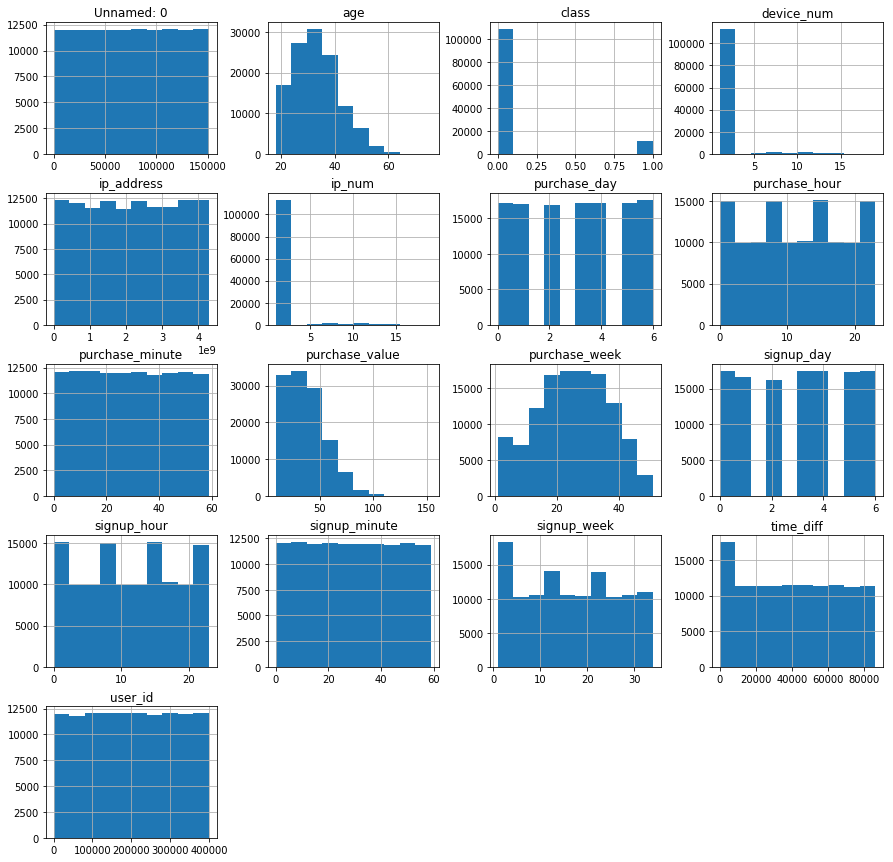

In [17]:
df.hist(figsize=(15,15))

In [18]:
df.columns
#np.array(num_cols).size

Index(['Unnamed: 0', 'user_id', 'signup_time', 'purchase_time',
       'purchase_value', 'device_id', 'source', 'browser', 'sex', 'age',
       'ip_address', 'class', 'country', 'time_diff', 'signup_minute',
       'signup_hour', 'signup_day', 'signup_week', 'purchase_minute',
       'purchase_hour', 'purchase_day', 'purchase_week', 'device_num',
       'ip_num'],
      dtype='object')

In [19]:
#int(5/3)+1

/apps/anaconda/3/current/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/apps/anaconda/3/current/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/apps/anaconda/3/current/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/apps/anaconda/3/current/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/apps/anaconda/3/current/lib

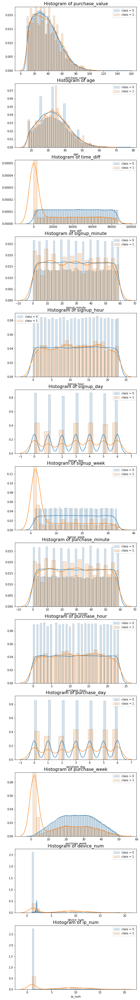

In [20]:
#numerical variables histograms
hist_kws={'histtype': 'bar', 'edgecolor':'black', 'alpha': 0.2}

cat_cols = np.array(['source', 'browser', 'sex','country'])
num_cols = np.array(['purchase_value', 'age','time_diff', 'signup_minute', 'signup_hour',
       'signup_day', 'signup_week', 'purchase_minute', 'purchase_hour',
       'purchase_day', 'purchase_week', 'device_num', 'ip_num'])
Ncol = num_cols.size
fig, ax = plt.subplots(nrows=Ncol, ncols=1, figsize=(8, 66))

for icol in range(Ncol):
    colname = num_cols[icol]
    sns.distplot(df[df['class'] == 0][colname], 
                 label='class = 0', ax=ax[icol], hist_kws=hist_kws)
    sns.distplot(df[df['class'] == 1][colname], 
                 label='class = 1', ax=ax[icol], hist_kws=hist_kws)
    ax[icol].set_title('Histogram of '+colname, fontsize=16)
    ax[icol].legend()

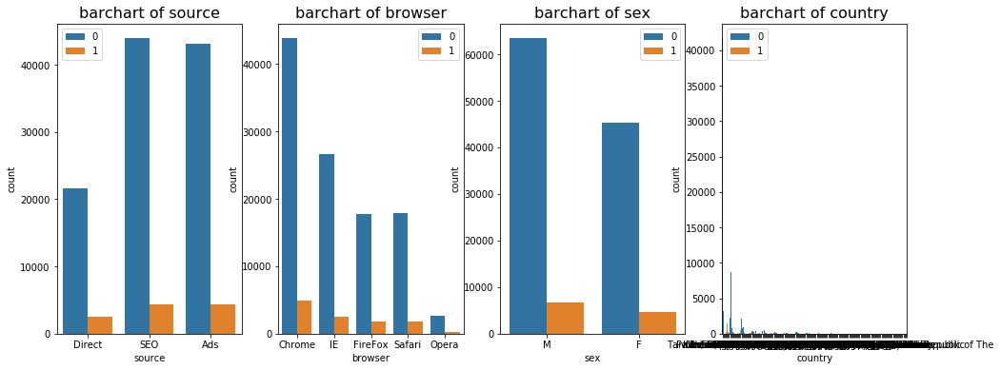

In [21]:
#categorical variables bar charts, put class = 0, 1 in the same barchart, I find it is hard to compare them without normalization
Ncol = cat_cols.size
fig, ax = plt.subplots(nrows=1, ncols=Ncol, figsize=(16, 6))

for icol in range(Ncol):
    colname = cat_cols[icol]
    sns.countplot(data=df,
                  x = colname,
                  hue = 'class', ax=ax[icol])
#    sns.distplot(df[df['class'] == 0][colname], 
#                 label='class = 0', ax=ax[icol], hist_kws=hist_kws)
#    sns.distplot(df[df['class'] == 1][colname], 
#                 label='class = 1', ax=ax[icol], hist_kws=hist_kws)
    ax[icol].set_title('barchart of '+colname, fontsize=16)
    ax[icol].legend()

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


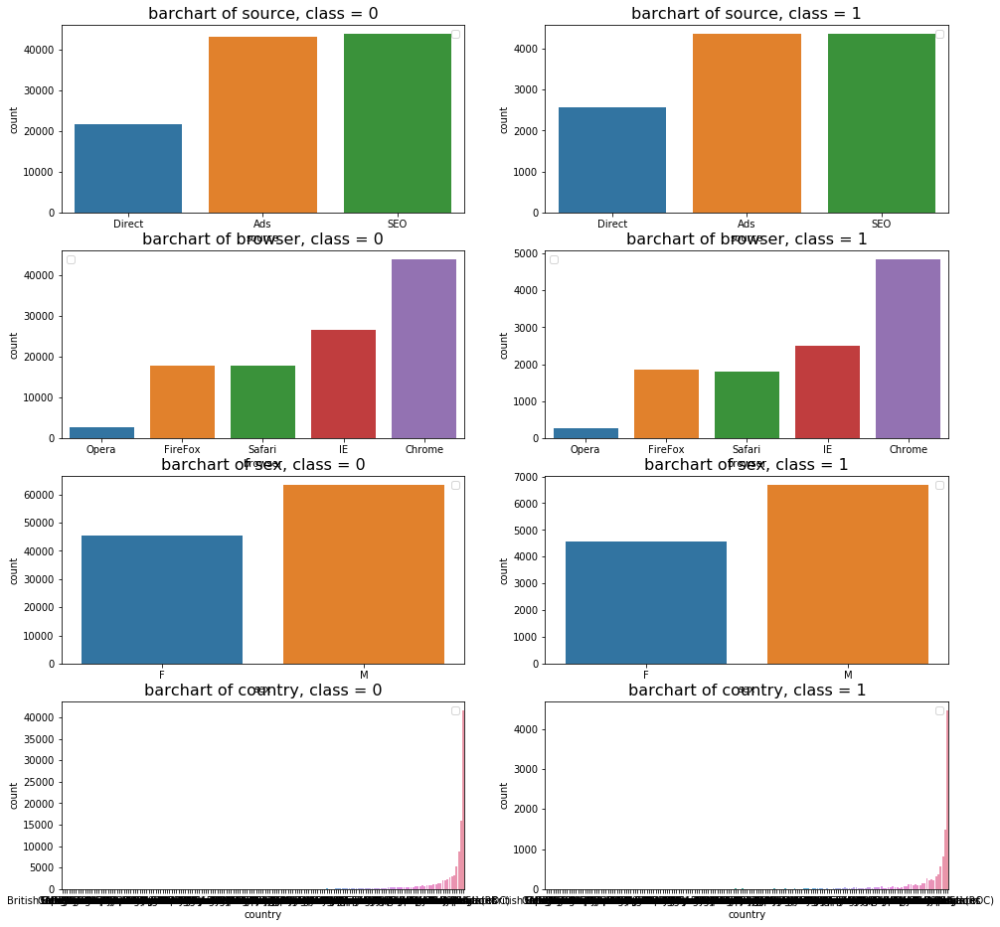

In [22]:
#categorical variables bar charts, compare the ratio of categories in non-fraud and fraud cases (class = 0, 1)
Ncol = cat_cols.size
fig, ax = plt.subplots(nrows=Ncol, ncols=2, figsize=(16, 16))

for icol in range(Ncol):
    colname = cat_cols[icol]
    order_tmp = df[colname].value_counts(ascending=True).index
    sns.countplot(x=colname, data=df[df['class'] == 0], ax=ax[icol,0], order=order_tmp)
    sns.countplot(x=colname, data=df[df['class'] == 1], ax=ax[icol,1], order=order_tmp)
#    sns.distplot(df[df['class'] == 0][colname], 
#                 label='class = 0', ax=ax[icol], hist_kws=hist_kws)
#    sns.distplot(df[df['class'] == 1][colname], 
#                 label='class = 1', ax=ax[icol], hist_kws=hist_kws)
    ax[icol,0].set_title('barchart of '+colname+', class = 0', fontsize=16)
    ax[icol,1].set_title('barchart of '+colname+', class = 1', fontsize=16)
    ax[icol,0].legend()
    ax[icol,1].legend()

In [23]:
#colname = 'country'
#df[colname].value_counts(ascending=True)#.index

No handles with labels found to put in legend.
No handles with labels found to put in legend.


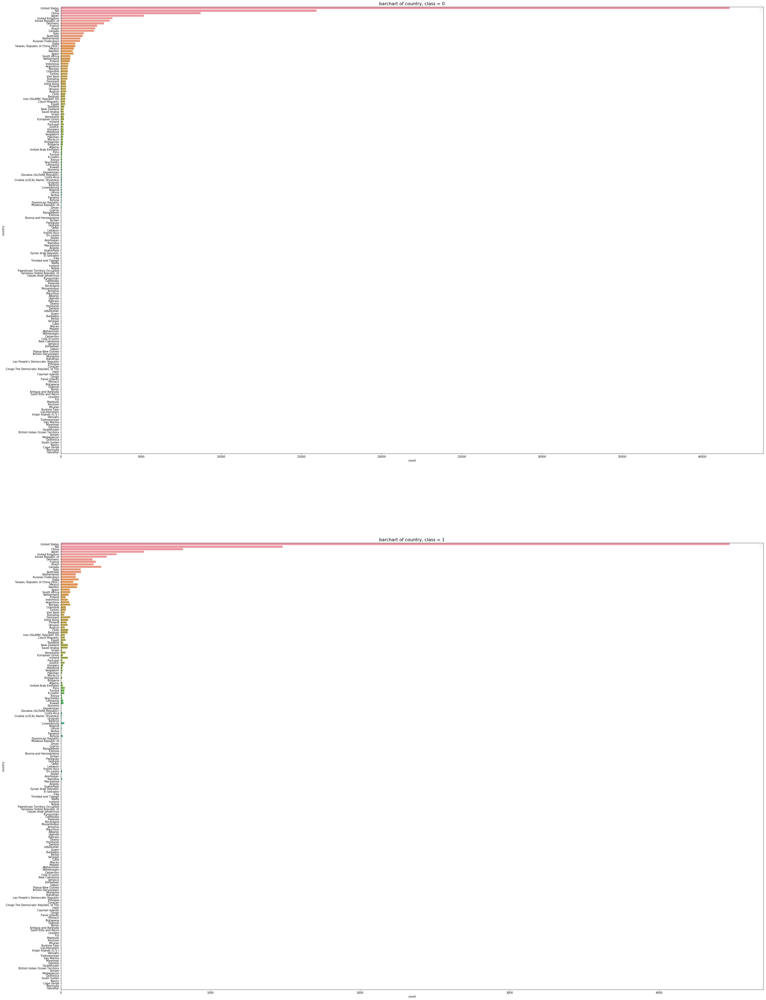

In [24]:
#plot country again, as there are too many countries
fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(46, 66))


colname = 'country'
order_tmp = df[colname].value_counts(ascending=False).index

sns.countplot(y=colname, data=df[df['class'] == 0], ax=ax[0], order=order_tmp)
sns.countplot(y=colname, data=df[df['class'] == 1], ax=ax[1], order=order_tmp)
#    sns.distplot(df[df['class'] == 0][colname], 
#                 label='class = 0', ax=ax[icol], hist_kws=hist_kws)
#    sns.distplot(df[df['class'] == 1][colname], 
#                 label='class = 1', ax=ax[icol], hist_kws=hist_kws)
ax[0].set_title('barchart of '+colname+', class = 0', fontsize=16)
ax[1].set_title('barchart of '+colname+', class = 1', fontsize=16)
ax[0].legend()
ax[1].legend()

## show categorical columns

In [25]:
df.columns

Index(['Unnamed: 0', 'user_id', 'signup_time', 'purchase_time',
       'purchase_value', 'device_id', 'source', 'browser', 'sex', 'age',
       'ip_address', 'class', 'country', 'time_diff', 'signup_minute',
       'signup_hour', 'signup_day', 'signup_week', 'purchase_minute',
       'purchase_hour', 'purchase_day', 'purchase_week', 'device_num',
       'ip_num'],
      dtype='object')

In [26]:
# = np.array(['source', 'browser', 'sex','country'])
#num_cols = np.array(['purchase_value', 'age','time_diff', 'signup_minute', 'signup_hour',
#       'signup_day', 'signup_week', 'purchase_minute', 'purchase_hour',
#       'purchase_day', 'purchase_week', 'device_num', 'ip_num'])
#cat_columns = ['source', 'browser', 'sex']

#for icol in cat_cols:
#    print('col: '+icol)
#    print(df[icol].value_counts() )
#    print('\n---------------------')

## Missing data

In [27]:
#missing data
total = df.isnull().sum()#.sort_values(ascending=False)
percent = (df.isnull().sum()/df.isnull().count())#.sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(20)

,Total,Percent
Unnamed: 0,0,0.0
user_id,0,0.0
signup_time,0,0.0
purchase_time,0,0.0
purchase_value,0,0.0
device_id,0,0.0
source,0,0.0
browser,0,0.0
sex,0,0.0
age,0,0.0


## Label Encoding

In [28]:
#Label Encoding some categorical variables 
# for information in their ordering set

from sklearn.preprocessing import LabelEncoder
cols = cat_cols
# process columns, apply LabelEncoder to categorical features
for c in cols:
    lbl = LabelEncoder() 
    lbl.fit(list(df[c].values)) 
    df[c] = lbl.transform(list(df[c].values))

# shape        
print('Shape all_data: {}'.format(df.shape))

Shape all_data: (120000, 24)


In [29]:
df.head()

,Unnamed: 0,user_id,signup_time,purchase_time,purchase_value,device_id,source,browser,sex,age,...,signup_minute,signup_hour,signup_day,signup_week,purchase_minute,purchase_hour,purchase_day,purchase_week,device_num,ip_num
0,149671,285108,2015-07-15 04:36:00,2015-09-10 14:17:00,31,HZAKVUFTDOSFD,1,0,1,49,...,36,4,2,29,17,14,3,37,2,1
1,15611,131009,2015-01-24 12:29:00,2015-04-13 04:53:00,31,XGQAJSOUJIZCC,2,2,0,21,...,29,12,5,4,53,4,0,16,1,1
2,73178,328855,2015-03-11 00:54:00,2015-04-05 12:23:00,16,VCCTAYDCWKZIY,1,2,1,26,...,54,0,2,11,23,12,6,14,1,1
3,84546,229053,2015-01-07 13:19:00,2015-01-09 10:12:00,29,MFFIHYNXCJLEY,2,0,1,34,...,19,13,2,2,12,10,4,2,1,1
4,35978,108439,2015-02-08 21:11:00,2015-04-09 14:26:00,26,WMSXWGVPNIFBM,0,1,1,33,...,11,21,6,6,26,14,3,15,1,1


## One-Hot Encoding

In [30]:
pd.get_dummies(df, columns=cols).head()

,Unnamed: 0,user_id,signup_time,purchase_time,purchase_value,device_id,age,ip_address,class,time_diff,...,country_167,country_168,country_169,country_170,country_171,country_172,country_173,country_174,country_175,country_176
0,149671,285108,2015-07-15 04:36:00,2015-09-10 14:17:00,31,HZAKVUFTDOSFD,49,2.818400e+09,0,34860,...,1,0,0,0,0,0,0,0,0,0
1,15611,131009,2015-01-24 12:29:00,2015-04-13 04:53:00,31,XGQAJSOUJIZCC,21,3.251268e+09,0,59040,...,0,0,0,0,0,0,0,0,0,0
2,73178,328855,2015-03-11 00:54:00,2015-04-05 12:23:00,16,VCCTAYDCWKZIY,26,2.727760e+09,0,41340,...,1,0,0,0,0,0,0,0,0,0
3,84546,229053,2015-01-07 13:19:00,2015-01-09 10:12:00,29,MFFIHYNXCJLEY,34,2.083420e+09,0,75180,...,0,0,0,0,0,0,0,0,0,0
4,35978,108439,2015-02-08 21:11:00,2015-04-09 14:26:00,26,WMSXWGVPNIFBM,33,3.207913e+09,0,62100,...,0,0,0,0,0,0,0,0,0,0


In [31]:
df = pd.get_dummies(df, columns=cols)
df.columns

Index(['Unnamed: 0', 'user_id', 'signup_time', 'purchase_time',
       'purchase_value', 'device_id', 'age', 'ip_address', 'class',
       'time_diff',
       ...
       'country_167', 'country_168', 'country_169', 'country_170',
       'country_171', 'country_172', 'country_173', 'country_174',
       'country_175', 'country_176'],
      dtype='object', length=207)

## correlation matrix

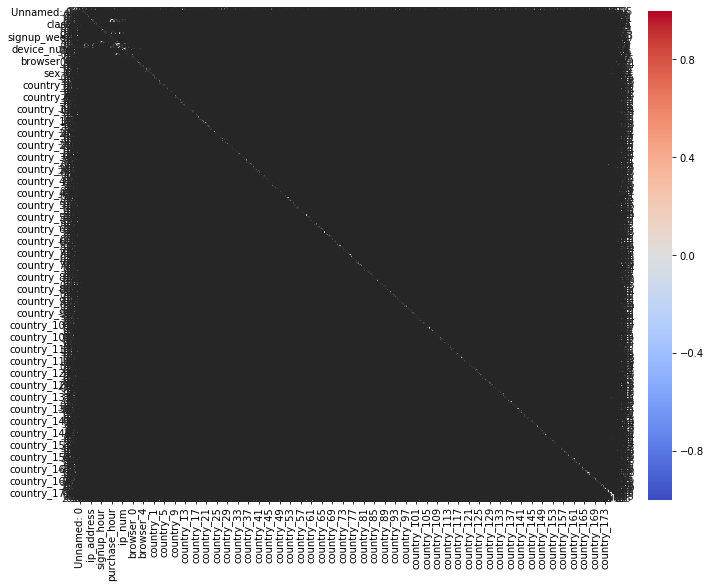

In [32]:
#correlation matrix
corrmat = df.corr()
#f, ax = plt.subplots(figsize=(12, 9))
#sns.heatmap(corrmat, vmax=.8, square=True);
#sns.heatmap(corrmat, vmax=.9, square=True);
#sns.heatmap(corrmat, cmap="coolwarm", annot=True, vmin=-1, vmax=1);

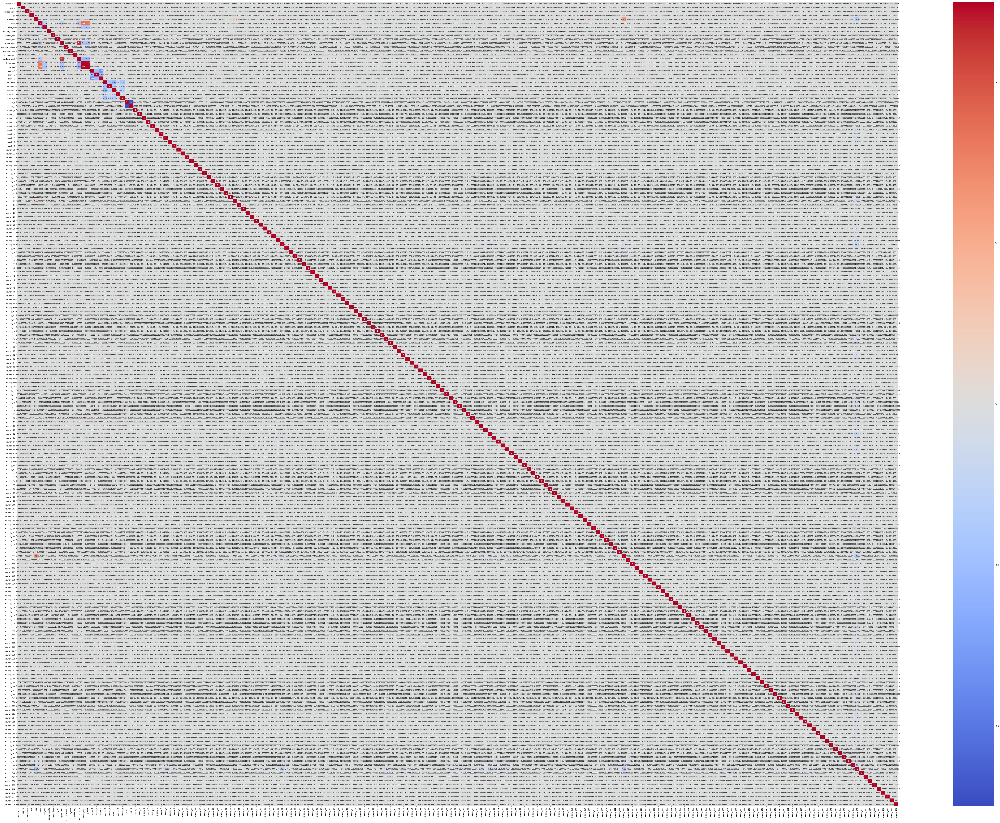

In [33]:
f, ax = plt.subplots(figsize=(120, 90))
sns.heatmap(corrmat, cmap="coolwarm", annot=True, vmin=-1, vmax=1);

correlation numbers:  (204, 204)


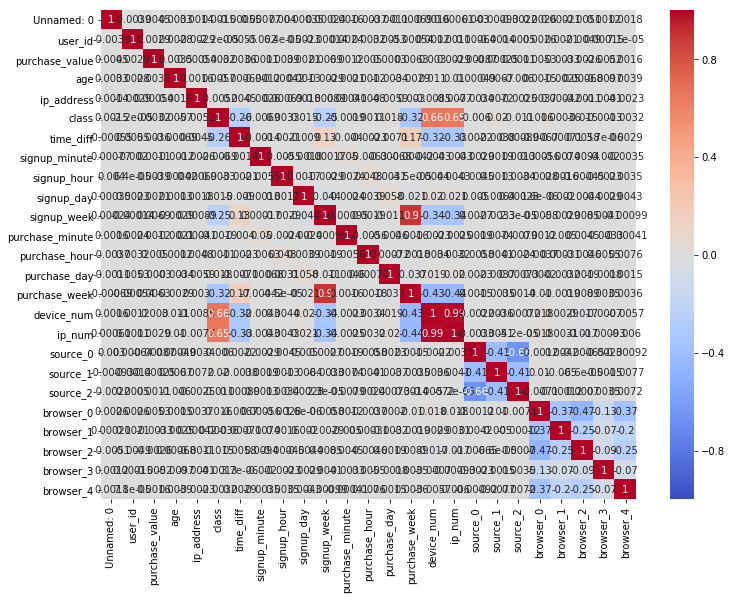

In [34]:
print('correlation numbers: ',corrmat.shape)
#only roughly the first 20 features are useful
#corrmat.iloc[:20,:20]
f, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(corrmat.iloc[:25,:25], cmap="coolwarm", annot=True, vmin=-1, vmax=1);

In [35]:
#see which features are very correlated with 'class'
for icol in range(120):
    if(corrmat['class'].iloc[icol]>0.1 or corrmat['class'].iloc[icol]<-0.1):
        print('colname: ',corrmat.columns[icol],', corr(class, colname): ',corrmat['class'].iloc[icol])

colname:  class , corr(class, colname):  1.0
colname:  time_diff , corr(class, colname):  -0.2592527470863759
colname:  signup_week , corr(class, colname):  -0.24797162020949254
colname:  purchase_week , corr(class, colname):  -0.3229025435894182
colname:  device_num , corr(class, colname):  0.6618032636691296
colname:  ip_num , corr(class, colname):  0.6500365241007612


In [36]:
#corrmat['class'].iloc[0]

# clean data

In [37]:
#device_num and ip_num are almost correlated, only select one in models
#although 'purchase_value' is not correlated with 'class', we need it to calculate the matrics of the model
df1 = df[['time_diff','signup_week','purchase_week','device_num','purchase_value','class']]

In [38]:
df1.head()

,time_diff,signup_week,purchase_week,device_num,purchase_value,class
0,34860,29,37,2,31,0
1,59040,4,16,1,31,0
2,41340,11,14,1,16,0
3,75180,2,2,1,29,0
4,62100,6,15,1,26,0


In [39]:
#keep the original data, in case I need to tune the model
#df_origin: put the data before cleaning
#df: put the data after cleaning
df_origin = df
df = df1


In [40]:
df.head()

,time_diff,signup_week,purchase_week,device_num,purchase_value,class
0,34860,29,37,2,31,0
1,59040,4,16,1,31,0
2,41340,11,14,1,16,0
3,75180,2,2,1,29,0
4,62100,6,15,1,26,0


# Build model: simple comparison

In [41]:
#define matrics in the 'detail' of 'candidate_tech_evaluation_candidate_copy_data science _Fraud_take_home.docx'
#input are y_true, y_pred, and df['purchase_value_array']
#output is the loss money
def my_custom_loss_func(y_true, y_pred, purchase_value_array):
    #set array we need to calculate the matrics
    #make sure all input are array 
    costfunc = 0.0
    y_true_array = np.array(y_true)
    y_pred_array = np.array(y_pred)
    purchase_value_array = np.array(purchase_value_array)
    #if y_true = 1, y_pred = 0, loss the purchase value
    #if y_true = 0, y_pred = 1, loss client values at $8 
    for ipt in range(y_true_array.size):
        if(y_true_array[ipt]==1 and y_pred_array[ipt]==0):
            costfunc-=purchase_value_array[ipt]

        elif(y_true_array[ipt]==0 and y_pred_array[ipt]==1):
            costfunc-=8.0
            
    #the cost function should be the expectation loss per purchase
    costfunc = costfunc/y_true_array.size
    return costfunc

## Split the data into train & test data sets

In [42]:
# Split The Data with all variables

from sklearn.model_selection import train_test_split

x = df.drop('class',axis=1)
y = df['class']

xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size=0.20, random_state=0)
print('xtrain shape')
print(xtrain.shape)
print('xtest shape')
print(xtest.shape)

xtrain shape
(96000, 5)
xtest shape
(24000, 5)


## Random Forest Algorithm

In [43]:
# RF Classifier explained

'''rf = RandomForestClassifier(n_estimators=100, oob_score=True, n_jobs=4)
n_estimators : integer, optional (default=10)
The number of trees in the forest.
oob_score : bool (default=False)
Whether to use out-of-bag samples to estimate the generalization accuracy.
n_jobs : integer, optional (default=1)
The number of jobs to run in parallel for both fit and predict. If -1, then the number of jobs is set to the number of cores.
'''

from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics

params = {'bootstrap': True,
 'criterion': 'mse',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 10,
 'n_jobs': 1,
 'oob_score': False,
 'random_state': 42,
 'verbose': 0,
 'warm_start': False}

#rfmodel = RandomForestClassifier()
#rfmodel = RandomForestClassifier(n_estimators=’warn’, criterion=’gini’, max_depth=None, min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features=’auto’, max_leaf_nodes=None, min_impurity_decrease=0.0, min_impurity_split=None, bootstrap=True, oob_score=False, n_jobs=None, random_state=None, verbose=0, warm_start=False, class_weight=None)
#rfmodel = RandomForestClassifier(**params)
#class_weight='balanced'
rfmodel = RandomForestClassifier(bootstrap=True, class_weight={0: 1, 1: 27}, criterion='gini',
            max_depth=5, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=4,
            oob_score=False, random_state=0, verbose=0, warm_start=False)


rfmodel.fit(xtrain,ytrain)
print('model')
print(rfmodel)

ypredrf = rfmodel.predict(xtest)
print('confusion matrix')
print(metrics.confusion_matrix(ytest, ypredrf))
print('classification report')
print(metrics.classification_report(ytest, ypredrf))
print('Accuracy : %f' % (metrics.accuracy_score(ytest, ypredrf)))
print('Area under the curve : %f' % (metrics.roc_auc_score(ytest, ypredrf)))

print('custom loss func : %f' % (my_custom_loss_func(ytest, ypredrf, xtest['purchase_value']) ))

model
RandomForestClassifier(bootstrap=True, class_weight={0: 1, 1: 27},
            criterion='gini', max_depth=5, max_features='auto',
            max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators=10, n_jobs=4, oob_score=False, random_state=0,
            verbose=0, warm_start=False)
confusion matrix
[[18394  3345]
 [  643  1618]]
classification report
             precision    recall  f1-score   support

          0       0.97      0.85      0.90     21739
          1       0.33      0.72      0.45      2261

avg / total       0.91      0.83      0.86     24000

Accuracy : 0.833833
Area under the curve : 0.780871
custom loss func : -2.106250


In [44]:
#test custom cost func
#my_custom_loss_func(ytest, ypredrf, xtest['purchase_value'])

In [45]:
#df_origin['purchase_value']
#(ypredrf-ytest).values

In [46]:
#np.array(ytest)[:10]
#xtest['purchase_value'].shape
#ytest.shape
#ypredrf.shape

Feature ranking:
1. feature 3 (0.477763)
2. feature 0 (0.228649)
3. feature 2 (0.222547)
4. feature 1 (0.067586)
5. feature 4 (0.003454)


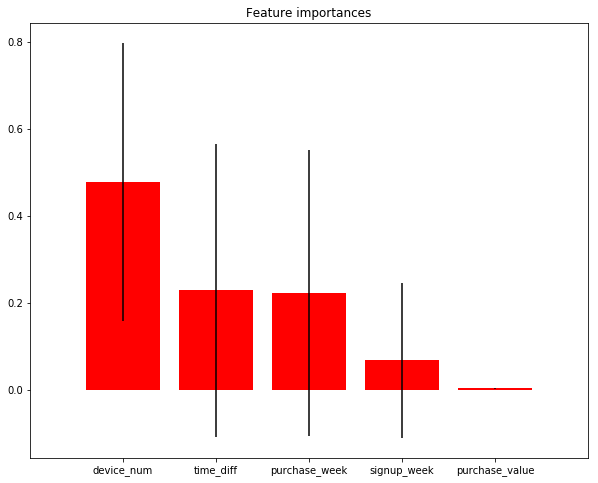

In [47]:
#feature importance
#just using the default method
#copy from https://scikit-learn.org/stable/auto_examples/ensemble/plot_forest_importances.html
importances = rfmodel.feature_importances_
std = np.std([tree.feature_importances_ for tree in rfmodel.estimators_],
             axis=0)
indices = np.argsort(importances)[::-1]
impo_cols = xtest.columns[indices]
# Print the feature ranking
print("Feature ranking:")

for f in range(xtest.shape[1]):
    print("%d. feature %d (%f)" % (f + 1, indices[f], importances[indices[f]]))

# Plot the feature importances of the forest
plt.figure(figsize=(10,8))
plt.title("Feature importances")
plt.bar(range(xtest.shape[1]), importances[indices],
       color="r", yerr=std[indices], align="center")
plt.xticks(range(xtest.shape[1]), impo_cols)
plt.xlim([-1, xtest.shape[1]])
plt.show()



## compare many models 

In [48]:


from sklearn.metrics import accuracy_score, log_loss
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC, NuSVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
#from xgboost import XGBClassifier
#import xgboost

classifiers = [
    KNeighborsClassifier(3),
#    SVC(kernel="rbf", C=0.025, probability=True),
#    NuSVC(probability=True),
#    DecisionTreeClassifier(),
#    RandomForestClassifier(),
#    XGBClassifier(),
#    AdaBoostClassifier(),
#    GradientBoostingClassifier(),
    GaussianNB(),
    LinearDiscriminantAnalysis(),
    QuadraticDiscriminantAnalysis()]



In [49]:
# Logging for Visual Comparison
log_cols=["Classifier", "Accuracy", "Log Loss"]
log = pd.DataFrame(columns=log_cols)

for clf in classifiers:
    clf.fit(xtrain, ytrain)
    name = clf.__class__.__name__
    
    print("="*30)
    print(name)
    
    print('****Results****')
#    train_predictions = clf.predict(X_test)
#    acc = accuracy_score(y_test, train_predictions)
#    print("Accuracy: {:.4%}".format(acc))
    
#    train_predictions = clf.predict_proba(X_test)
#    ll = log_loss(y_test, train_predictions)
#    print("Log Loss: {}".format(ll))
    
#    log_entry = pd.DataFrame([[name, acc*100, ll]], columns=log_cols)
#    log = log.append(log_entry)
    
    clf.fit(xtrain,ytrain)
    print('model')
    print(clf)

    ypredrf = clf.predict(xtest)
    print('confusion matrix')
    print(metrics.confusion_matrix(ytest, ypredrf))
    print('classification report')
    print(metrics.classification_report(ytest, ypredrf))
    print('Accuracy : %f' % (metrics.accuracy_score(ytest, ypredrf)))
    print('Area under the curve : %f' % (metrics.roc_auc_score(ytest, ypredrf)))

    print('custom loss func : %f' % (my_custom_loss_func(ytest, ypredrf, xtest['purchase_value']) ))
    
print("="*30)

KNeighborsClassifier
****Results****
model
KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=3, p=2,
           weights='uniform')
confusion matrix
[[21608   131]
 [ 1050  1211]]
classification report
             precision    recall  f1-score   support

          0       0.95      0.99      0.97     21739
          1       0.90      0.54      0.67      2261

avg / total       0.95      0.95      0.95     24000

Accuracy : 0.950792
Area under the curve : 0.764789
custom loss func : -1.667500
GaussianNB
****Results****
model
GaussianNB(priors=None)
confusion matrix
[[21628   111]
 [ 1051  1210]]
classification report
             precision    recall  f1-score   support

          0       0.95      0.99      0.97     21739
          1       0.92      0.54      0.68      2261

avg / total       0.95      0.95      0.95     24000

Accuracy : 0.951583
Area under the curve : 0.765028
custom loss func : -1.661875
Line

# Build model: tune parameters

In [50]:
#because the make_scorer only allow me to input a function with y_true, y_pred as variable
#I need to redefine the custom loss function, with df['purchase_value'] as a global variable
def my_custom_loss_func_v2(y_true, y_pred):
    #set array we need to calculate the matrics
    #make sure all input are array 
    costfunc = 0.0
    y_true_array = np.array(y_true)
    y_pred_array = np.array(y_pred)
    
    #because parameter-tuning is for train data, we assume this function will only input train data
    purchase_value_array = xtrain['purchase_value']
    purchase_value_array = np.array(purchase_value_array)
    #if y_true = 1, y_pred = 0, loss the purchase value
    #if y_true = 0, y_pred = 1, loss client values at $8 
    for ipt in range(y_true_array.size):
        if(y_true_array[ipt]==1 and y_pred_array[ipt]==0):
            costfunc-=purchase_value_array[ipt]

        elif(y_true_array[ipt]==0 and y_pred_array[ipt]==1):
            costfunc-=8.0
            
    #the cost function should be the expectation loss per purchase
    costfunc = costfunc/y_true_array.size
    return costfunc

In [51]:
#test custom cost func
my_custom_loss_func_v2(ytest, ypredrf)


-1.6485

In [52]:
from sklearn.metrics import make_scorer
from sklearn.model_selection import GridSearchCV

#use custom func as the score in parameter-tuning criteria 
my_scorer = make_scorer(my_custom_loss_func_v2, greater_is_better=True)

#use grid search to find the best parameters in models
param_grid = {
    'bootstrap': [True],
    'max_depth': [5, 20],#[80, 90, 100, 110],
    'max_features': ['auto'],#[2, 3],
    'min_samples_leaf': [1],#[3, 4, 5],
    'min_samples_split': [2],#[8, 10, 12],
    'n_estimators': [5, 10, 50],#[100, 200, 300, 1000]
    'class_weight': [{0: 1, 1: 1}, {0: 1, 1: 5}, {0: 1, 1: 10}, {0: 1, 1: 20}, {0: 1, 1: 30}] 
}

gsearch1 = GridSearchCV(estimator = RandomForestClassifier(), 
                       param_grid = param_grid, scoring=my_scorer,n_jobs=2, cv=5)
#gsearch1 = GridSearchCV(estimator = RandomForestClassifier(), 
#                       param_grid = param_grid, n_jobs=2, cv=5)

#gsearch1 = GridSearchCV(estimator = XGBClassifier( learning_rate =0.1, n_estimators=140, max_depth=5,
#                                        min_child_weight=1, gamma=0, subsample=0.8, colsample_bytree=0.8,
#                                        objective= 'binary:logistic', nthread=4, scale_pos_weight=1, seed=27), 
#                       param_grid = param_test1, scoring='roc_auc',n_jobs=4,iid=False, cv=5)


#grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
#                          cv = 3, n_jobs = -1, verbose = 2)

#svr = GridSearchCV(SVR(kernel='rbf', gamma=0.1),
#                   scoring=my_scorer,
#                   cv=5,
#                   param_grid={"C": [1e0, 1e1, 1e2, 1e3],
#                               "gamma": np.logspace(-2, 2, 5)})

#rfmodel = RandomForestClassifier(bootstrap=True, class_weight={0: 1, 1: 27}, criterion='gini',
#            max_depth=5, max_features='auto', max_leaf_nodes=None,
#            min_impurity_decrease=0.0, min_impurity_split=None,
#            min_samples_leaf=1, min_samples_split=2,
#            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=4,
#            oob_score=False, random_state=0, verbose=0, warm_start=False)


gsearch1.fit(xtrain,ytrain)


GridSearchCV(cv=5, error_score='raise',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
       fit_params=None, iid=True, n_jobs=2,
       param_grid={'bootstrap': [True], 'max_depth': [5, 20], 'max_features': ['auto'], 'min_samples_leaf': [1], 'min_samples_split': [2], 'n_estimators': [5, 10, 50], 'class_weight': [{0: 1, 1: 1}, {0: 1, 1: 5}, {0: 1, 1: 10}, {0: 1, 1: 20}, {0: 1, 1: 30}]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=make_scorer(my_custom_loss_func_v2), verbose=0)

In [53]:
gsearch1.grid_scores_, gsearch1.best_params_, gsearch1.best_score_

/apps/anaconda/3/current/lib/python3.6/site-packages/sklearn/model_selection/_search.py:761: DeprecationWarning: The grid_scores_ attribute was deprecated in version 0.18 in favor of the more elaborate cv_results_ attribute. The grid_scores_ attribute will not be available from 0.20
  DeprecationWarning)


([mean: -1.61645, std: 0.06405, params: {'bootstrap': True, 'class_weight': {0: 1, 1: 1}, 'max_depth': 5, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 5},
  mean: -1.61620, std: 0.06458, params: {'bootstrap': True, 'class_weight': {0: 1, 1: 1}, 'max_depth': 5, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 10},
  mean: -1.61611, std: 0.06452, params: {'bootstrap': True, 'class_weight': {0: 1, 1: 1}, 'max_depth': 5, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 50},
  mean: -1.60477, std: 0.06111, params: {'bootstrap': True, 'class_weight': {0: 1, 1: 1}, 'max_depth': 20, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 5},
  mean: -1.60763, std: 0.05663, params: {'bootstrap': True, 'class_weight': {0: 1, 1: 1}, 'max_depth': 20, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 10},
  mean: -1

According to the cross validation, the best-parameter model also have small a standard deviation, this means it is less overfitting among all models 

In [63]:
#tune second time 
param_grid = {
    'bootstrap': [True],
    'max_depth': [5, 7],#[80, 90, 100, 110],
    'max_features': ['auto'],#[2, 3],
    'min_samples_leaf': [1],#[3, 4, 5],
    'min_samples_split': [2],#[8, 10, 12],
    'n_estimators': [100, 300],#[100, 200, 300, 1000]
    'class_weight': [{0: 1, 1: 5}, {0: 1, 1: 10}, {0: 1, 1: 15}, {0: 1, 1: 20}] 
}

gsearch1 = GridSearchCV(estimator = RandomForestClassifier(), 
                       param_grid = param_grid, scoring=my_scorer,n_jobs=16, cv=5)

gsearch1.fit(xtrain,ytrain)

GridSearchCV(cv=5, error_score='raise',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
       fit_params=None, iid=True, n_jobs=16,
       param_grid={'bootstrap': [True], 'max_depth': [5, 7], 'max_features': ['auto'], 'min_samples_leaf': [1], 'min_samples_split': [2], 'n_estimators': [100, 300], 'class_weight': [{0: 1, 1: 5}, {0: 1, 1: 10}, {0: 1, 1: 15}, {0: 1, 1: 20}]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=make_scorer(my_custom_loss_func_v2), verbose=0)

In [64]:
gsearch1.grid_scores_, gsearch1.best_params_, gsearch1.best_score_

/apps/anaconda/3/current/lib/python3.6/site-packages/sklearn/model_selection/_search.py:761: DeprecationWarning: The grid_scores_ attribute was deprecated in version 0.18 in favor of the more elaborate cv_results_ attribute. The grid_scores_ attribute will not be available from 0.20
  DeprecationWarning)


([mean: -1.48411, std: 0.04745, params: {'bootstrap': True, 'class_weight': {0: 1, 1: 5}, 'max_depth': 5, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100},
  mean: -1.48397, std: 0.04740, params: {'bootstrap': True, 'class_weight': {0: 1, 1: 5}, 'max_depth': 5, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300},
  mean: -1.48578, std: 0.04193, params: {'bootstrap': True, 'class_weight': {0: 1, 1: 5}, 'max_depth': 7, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100},
  mean: -1.48626, std: 0.04209, params: {'bootstrap': True, 'class_weight': {0: 1, 1: 5}, 'max_depth': 7, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300},
  mean: -1.48168, std: 0.04507, params: {'bootstrap': True, 'class_weight': {0: 1, 1: 10}, 'max_depth': 5, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100},
  me

## use the best-parameter model 

In [65]:
rfc_best = RandomForestClassifier(**gsearch1.best_params_)

rfc_best.fit(xtrain,ytrain)
print('model')
print(rfc_best)

ypredrf = rfc_best.predict(xtest)
print('confusion matrix')
print(metrics.confusion_matrix(ytest, ypredrf))
print('classification report')
print(metrics.classification_report(ytest, ypredrf))
print('Accuracy : %f' % (metrics.accuracy_score(ytest, ypredrf)))
print('Area under the curve : %f' % (metrics.roc_auc_score(ytest, ypredrf)))

print('custom loss func : %f' % (my_custom_loss_func(ytest, ypredrf, xtest['purchase_value']) ))


model
RandomForestClassifier(bootstrap=True, class_weight={0: 1, 1: 10},
            criterion='gini', max_depth=7, max_features='auto',
            max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators=300, n_jobs=1, oob_score=False, random_state=None,
            verbose=0, warm_start=False)
confusion matrix
[[20644  1095]
 [  713  1548]]
classification report
             precision    recall  f1-score   support

          0       0.97      0.95      0.96     21739
          1       0.59      0.68      0.63      2261

avg / total       0.93      0.92      0.93     24000

Accuracy : 0.924667
Area under the curve : 0.817141
custom loss func : -1.467417


Feature ranking:
1. feature 3 (0.495707)
2. feature 0 (0.267454)
3. feature 2 (0.161350)
4. feature 1 (0.068762)
5. feature 4 (0.006726)


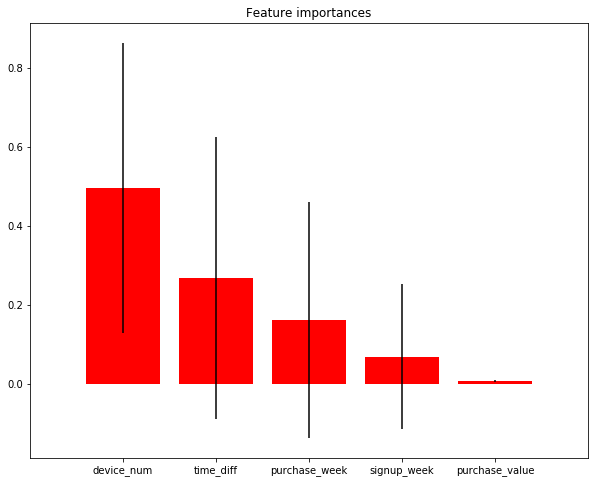

In [66]:
#feature importance
#just using the default method
#copy from https://scikit-learn.org/stable/auto_examples/ensemble/plot_forest_importances.html
importances = rfc_best.feature_importances_
std = np.std([tree.feature_importances_ for tree in rfc_best.estimators_],
             axis=0)
indices = np.argsort(importances)[::-1]
impo_cols = xtest.columns[indices]
# Print the feature ranking
print("Feature ranking:")

for f in range(xtest.shape[1]):
    print("%d. feature %d (%f)" % (f + 1, indices[f], importances[indices[f]]))

# Plot the feature importances of the forest
plt.figure(figsize=(10,8))
plt.title("Feature importances")
plt.bar(range(xtest.shape[1]), importances[indices],
       color="r", yerr=std[indices], align="center")
plt.xticks(range(xtest.shape[1]), impo_cols)
plt.xlim([-1, xtest.shape[1]])
plt.show()



# conclusion

with random forests hyper-parameter tuning,
the best random forests model is

the custom loss func (defined by the problem) : -1.467417$ per purchasing
    
with the best-parameter = 
{'bootstrap': True,
  'class_weight': {0: 1, 1: 10},
  'max_depth': 7,
  'max_features': 'auto',
  'min_samples_leaf': 1,
  'min_samples_split': 2,
  'n_estimators': 300}

Therefore, for the random forest, n_estimators should be as large as possible, and max_depth should not be too large,
the weight of fraud data should be ~ 10 times

The most important features are device_num, time_diff, purchase_week, signup_week